**Imports & Drive Mount**

In [ ]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings


In [ ]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [ ]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_checkpoints"
log_dir = "D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_logs"

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_logs"

Checkpoints will be saved to: D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_logs
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6009 (pid 5504), started 2:31:26 ago. (Use '!kill 5504' to kill it.)

**MONAI Preprocessing Transforms**

In [ ]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [ ]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [ ]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 36 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


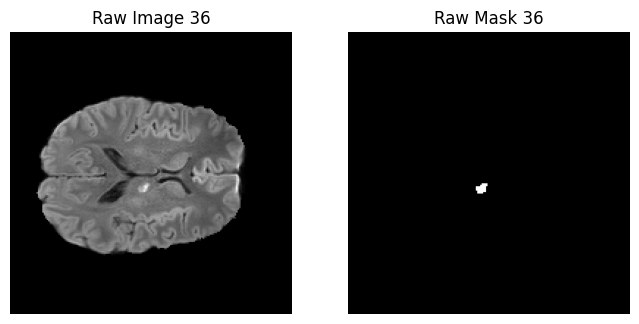

Sample 31 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


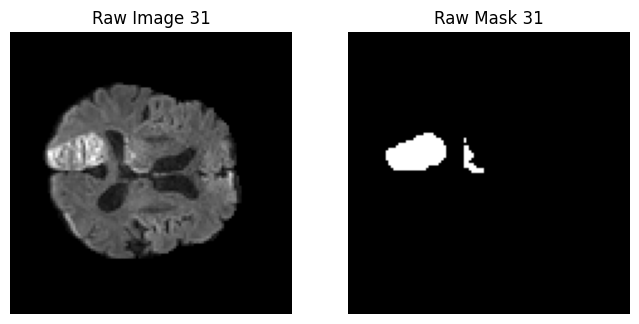

Client 0 - Preprocessed Samples:
Sample 36 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


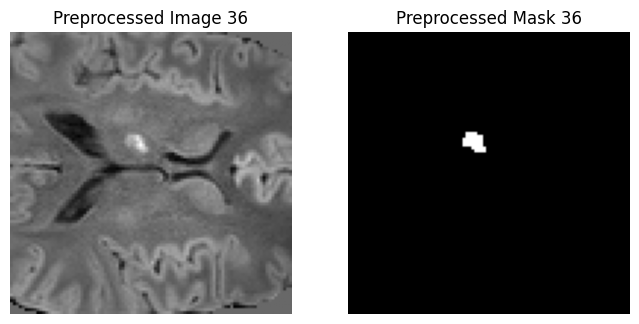

Sample 31 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


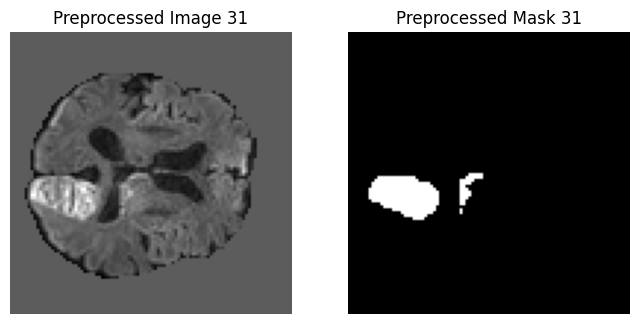

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 37 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


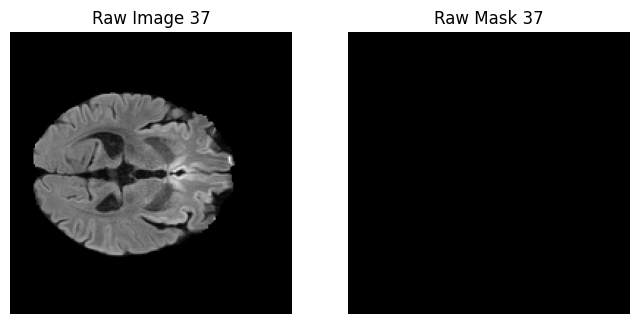

Sample 46 | Image shape: (128, 128, 30) | Mask shape: (128, 128, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


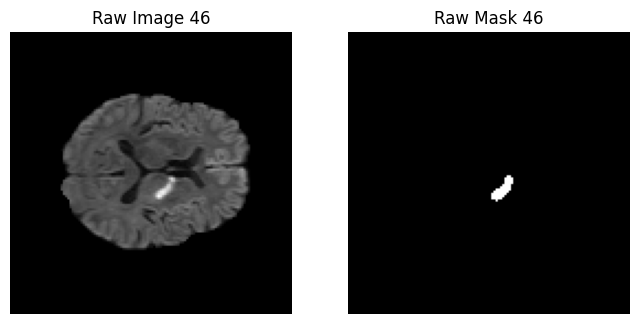

Client 1 - Preprocessed Samples:
Sample 37 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


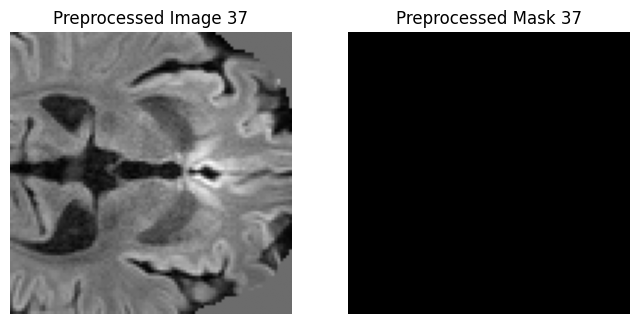

Sample 46 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


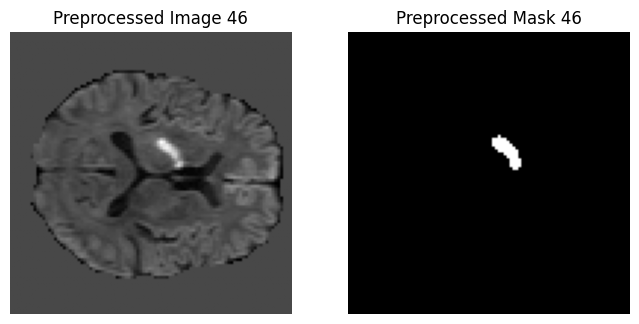

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 35 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


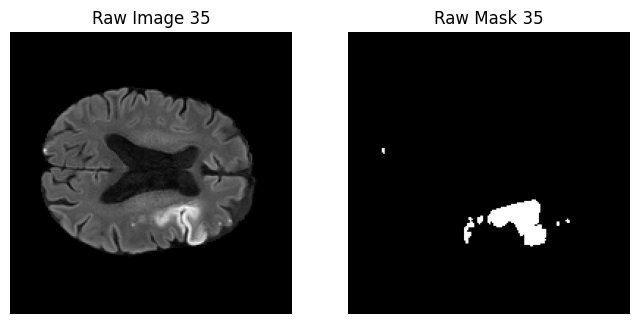

Sample 1 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


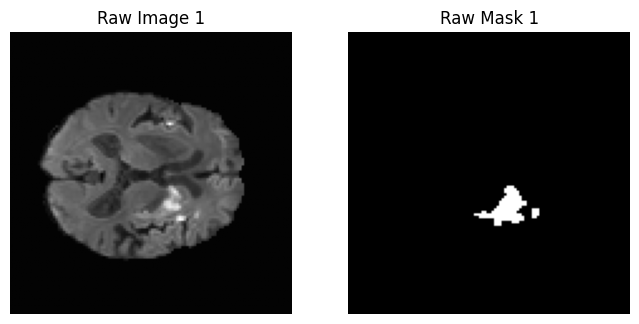

Client 2 - Preprocessed Samples:
Sample 35 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


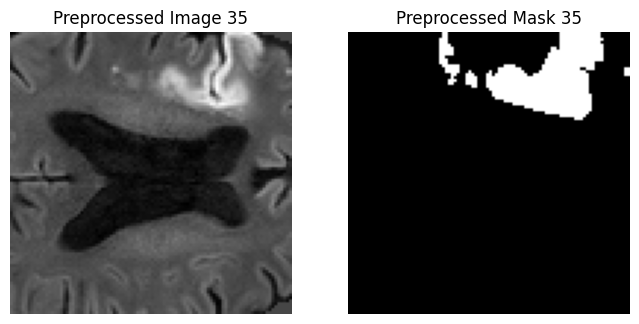

Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


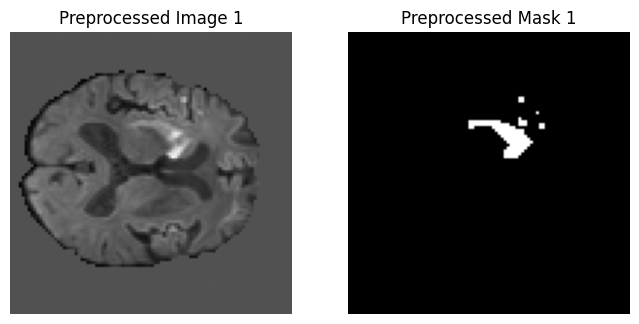

Client 2 samples: 50


In [ ]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [ ]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


ResNet

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [ ]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [ ]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Using device: cuda
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(

**Federated Training loop**

In [ ]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8587 | Dice: 0.0972 | IoU: 0.0511 | HD95: 48.1368


Client 0 | Epoch 2/20 | Loss: 0.8392 | Dice: 0.1521 | IoU: 0.0823 | HD95: 38.3246


Client 0 | Epoch 3/20 | Loss: 0.8315 | Dice: 0.1848 | IoU: 0.1018 | HD95: 37.7442


Client 0 | Epoch 4/20 | Loss: 0.8255 | Dice: 0.2043 | IoU: 0.1138 | HD95: 36.4357


Client 0 | Epoch 5/20 | Loss: 0.8205 | Dice: 0.1897 | IoU: 0.1048 | HD95: 35.3867


Client 0 | Epoch 6/20 | Loss: 0.8153 | Dice: 0.2222 | IoU: 0.1250 | HD95: 35.8144


Client 0 | Epoch 7/20 | Loss: 0.8098 | Dice: 0.2431 | IoU: 0.1384 | HD95: 35.3741


Client 0 | Epoch 8/20 | Loss: 0.8063 | Dice: 0.2288 | IoU: 0.1292 | HD95: 35.3185


Client 0 | Epoch 9/20 | Loss: 0.8016 | Dice: 0.2491 | IoU: 0.1423 | HD95: 35.1570


Client 0 | Epoch 10/20 | Loss: 0.7975 | Dice: 0.2501 | IoU: 0.1429 | HD95: 34.2018


Client 0 | Epoch 11/20 | Loss: 0.7926 | Dice: 0.2665 | IoU: 0.1537 | HD95: 33.7149


Client 0 | Epoch 12/20 | Loss: 0.7893 | Dice: 0.2544 | IoU: 0.1457 | HD95: 33.6424


Client 0 | Epoch 13/20 | Loss: 0.7851 | Dice: 0.2850 | IoU: 0.1662 | HD95: 32.8400


Client 0 | Epoch 14/20 | Loss: 0.7807 | Dice: 0.2964 | IoU: 0.1740 | HD95: 32.1639


Client 0 | Epoch 15/20 | Loss: 0.7778 | Dice: 0.2961 | IoU: 0.1738 | HD95: 32.4124


Client 0 | Epoch 16/20 | Loss: 0.7743 | Dice: 0.2828 | IoU: 0.1647 | HD95: 31.9972


Client 0 | Epoch 17/20 | Loss: 0.7703 | Dice: 0.3295 | IoU: 0.1973 | HD95: 29.9471


Client 0 | Epoch 18/20 | Loss: 0.7670 | Dice: 0.2955 | IoU: 0.1734 | HD95: 30.7386


Client 0 | Epoch 19/20 | Loss: 0.7640 | Dice: 0.3171 | IoU: 0.1884 | HD95: 30.6615


Clients Training:  33%|███▎      | 1/3 [02:54<05:48, 174.23s/it]

Client 0 | Epoch 20/20 | Loss: 0.7612 | Dice: 0.2720 | IoU: 0.1574 | HD95: 31.8586
Client 0 | Loss=0.7984 | Dice=0.2720 | IoU=0.1574 | HD95=31.8586


Client 1 | Epoch 1/20 | Loss: 0.8604 | Dice: 0.0889 | IoU: 0.0465 | HD95: 44.5362


Client 1 | Epoch 2/20 | Loss: 0.8401 | Dice: 0.1356 | IoU: 0.0727 | HD95: 35.2859


Client 1 | Epoch 3/20 | Loss: 0.8307 | Dice: 0.1940 | IoU: 0.1074 | HD95: 34.2244


Client 1 | Epoch 4/20 | Loss: 0.8250 | Dice: 0.2184 | IoU: 0.1226 | HD95: 33.7384


Client 1 | Epoch 5/20 | Loss: 0.8193 | Dice: 0.2290 | IoU: 0.1293 | HD95: 33.8685


Client 1 | Epoch 6/20 | Loss: 0.8144 | Dice: 0.2339 | IoU: 0.1324 | HD95: 33.7943


Client 1 | Epoch 7/20 | Loss: 0.8094 | Dice: 0.2637 | IoU: 0.1519 | HD95: 34.0793


Client 1 | Epoch 8/20 | Loss: 0.8055 | Dice: 0.2782 | IoU: 0.1616 | HD95: 33.3412


Client 1 | Epoch 9/20 | Loss: 0.8010 | Dice: 0.2606 | IoU: 0.1498 | HD95: 33.1550


Client 1 | Epoch 10/20 | Loss: 0.7973 | Dice: 0.2813 | IoU: 0.1636 | HD95: 31.7775


Client 1 | Epoch 11/20 | Loss: 0.7928 | Dice: 0.2971 | IoU: 0.1745 | HD95: 30.8321


Client 1 | Epoch 12/20 | Loss: 0.7890 | Dice: 0.3059 | IoU: 0.1805 | HD95: 30.1129


Client 1 | Epoch 13/20 | Loss: 0.7856 | Dice: 0.3144 | IoU: 0.1865 | HD95: 31.0354


Client 1 | Epoch 14/20 | Loss: 0.7810 | Dice: 0.3178 | IoU: 0.1889 | HD95: 28.5942


Client 1 | Epoch 15/20 | Loss: 0.7784 | Dice: 0.3259 | IoU: 0.1947 | HD95: 29.6646


Client 1 | Epoch 16/20 | Loss: 0.7749 | Dice: 0.3093 | IoU: 0.1830 | HD95: 30.2033


Client 1 | Epoch 17/20 | Loss: 0.7705 | Dice: 0.3409 | IoU: 0.2055 | HD95: 26.4857


Client 1 | Epoch 18/20 | Loss: 0.7668 | Dice: 0.3395 | IoU: 0.2045 | HD95: 28.5862


Client 1 | Epoch 19/20 | Loss: 0.7633 | Dice: 0.3683 | IoU: 0.2257 | HD95: 26.2945


Clients Training:  67%|██████▋   | 2/3 [05:51<02:56, 176.19s/it]

Client 1 | Epoch 20/20 | Loss: 0.7602 | Dice: 0.3545 | IoU: 0.2154 | HD95: 27.6902
Client 1 | Loss=0.7983 | Dice=0.3545 | IoU=0.2154 | HD95=27.6902


Client 2 | Epoch 1/20 | Loss: 0.8585 | Dice: 0.0990 | IoU: 0.0521 | HD95: 47.0967


Client 2 | Epoch 2/20 | Loss: 0.8357 | Dice: 0.1958 | IoU: 0.1085 | HD95: 37.2620


Client 2 | Epoch 3/20 | Loss: 0.8280 | Dice: 0.2394 | IoU: 0.1360 | HD95: 37.3007


Client 2 | Epoch 4/20 | Loss: 0.8226 | Dice: 0.2489 | IoU: 0.1422 | HD95: 36.5280


Client 2 | Epoch 5/20 | Loss: 0.8167 | Dice: 0.2640 | IoU: 0.1521 | HD95: 35.4211


Client 2 | Epoch 6/20 | Loss: 0.8124 | Dice: 0.2848 | IoU: 0.1660 | HD95: 35.4728


Client 2 | Epoch 7/20 | Loss: 0.8078 | Dice: 0.2858 | IoU: 0.1667 | HD95: 35.8029


Client 2 | Epoch 8/20 | Loss: 0.8024 | Dice: 0.3086 | IoU: 0.1824 | HD95: 34.3333


Client 2 | Epoch 9/20 | Loss: 0.7979 | Dice: 0.3111 | IoU: 0.1842 | HD95: 33.4294


Client 2 | Epoch 10/20 | Loss: 0.7937 | Dice: 0.3250 | IoU: 0.1941 | HD95: 32.4081


Client 2 | Epoch 11/20 | Loss: 0.7886 | Dice: 0.3502 | IoU: 0.2123 | HD95: 32.4381


Client 2 | Epoch 12/20 | Loss: 0.7854 | Dice: 0.3193 | IoU: 0.1900 | HD95: 33.5419


Client 2 | Epoch 13/20 | Loss: 0.7824 | Dice: 0.3278 | IoU: 0.1960 | HD95: 33.8439


Client 2 | Epoch 14/20 | Loss: 0.7780 | Dice: 0.3608 | IoU: 0.2201 | HD95: 32.7041


Client 2 | Epoch 15/20 | Loss: 0.7733 | Dice: 0.3805 | IoU: 0.2349 | HD95: 30.4371


Client 2 | Epoch 16/20 | Loss: 0.7696 | Dice: 0.3552 | IoU: 0.2160 | HD95: 29.5658


Client 2 | Epoch 17/20 | Loss: 0.7662 | Dice: 0.3689 | IoU: 0.2262 | HD95: 29.8575


Client 2 | Epoch 18/20 | Loss: 0.7616 | Dice: 0.4056 | IoU: 0.2544 | HD95: 26.5636


Client 2 | Epoch 19/20 | Loss: 0.7579 | Dice: 0.4164 | IoU: 0.2629 | HD95: 27.6046


Client 2 Epochs: 100%|██████████| 20/20 [02:56<00:00,  8.83s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7543 | Dice: 0.4225 | IoU: 0.2678 | HD95: 27.6870
Client 2 | Loss=0.7946 | Dice=0.4225 | IoU=0.2678 | HD95=27.6870


Best global model updated with Dice=0.2212
Global | Val Loss=0.7672 | Dice=0.2212 | IoU=0.1243 | HD95=34.5725
Checkpoint saved for round 1 at D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7581 | Dice: 0.3163 | IoU: 0.1879 | HD95: 31.4389


Client 0 | Epoch 2/20 | Loss: 0.7542 | Dice: 0.2864 | IoU: 0.1671 | HD95: 31.5177


Client 0 | Epoch 3/20 | Loss: 0.7507 | Dice: 0.3264 | IoU: 0.1950 | HD95: 29.2940


Client 0 | Epoch 4/20 | Loss: 0.7480 | Dice: 0.2999 | IoU: 0.1764 | HD95: 30.2046


Client 0 | Epoch 5/20 | Loss: 0.7441 | Dice: 0.3658 | IoU: 0.2238 | HD95: 28.4254


Client 0 | Epoch 6/20 | Loss: 0.7408 | Dice: 0.3585 | IoU: 0.2184 | HD95: 25.9881


Client 0 | Epoch 7/20 | Loss: 0.7382 | Dice: 0.3385 | IoU: 0.2037 | HD95: 26.9994


Client 0 | Epoch 8/20 | Loss: 0.7377 | Dice: 0.3653 | IoU: 0.2234 | HD95: 29.4292


Client 0 | Epoch 9/20 | Loss: 0.7325 | Dice: 0.3584 | IoU: 0.2183 | HD95: 27.5286


Client 0 | Epoch 10/20 | Loss: 0.7290 | Dice: 0.3649 | IoU: 0.2232 | HD95: 26.8058


Client 0 | Epoch 11/20 | Loss: 0.7252 | Dice: 0.4229 | IoU: 0.2681 | HD95: 24.5644


Client 0 | Epoch 12/20 | Loss: 0.7222 | Dice: 0.4352 | IoU: 0.2781 | HD95: 24.2204


Client 0 | Epoch 13/20 | Loss: 0.7192 | Dice: 0.4404 | IoU: 0.2824 | HD95: 23.7745


Client 0 | Epoch 14/20 | Loss: 0.7162 | Dice: 0.4426 | IoU: 0.2842 | HD95: 23.2167


Client 0 | Epoch 15/20 | Loss: 0.7128 | Dice: 0.4740 | IoU: 0.3106 | HD95: 21.2344


Client 0 | Epoch 16/20 | Loss: 0.7107 | Dice: 0.4156 | IoU: 0.2623 | HD95: 24.1813


Client 0 | Epoch 17/20 | Loss: 0.7068 | Dice: 0.4669 | IoU: 0.3045 | HD95: 23.4822


Client 0 | Epoch 18/20 | Loss: 0.7033 | Dice: 0.4795 | IoU: 0.3154 | HD95: 21.5068


Client 0 | Epoch 19/20 | Loss: 0.7003 | Dice: 0.4734 | IoU: 0.3101 | HD95: 22.7368


Clients Training:  33%|███▎      | 1/3 [02:46<05:33, 166.79s/it]

Client 0 | Epoch 20/20 | Loss: 0.6972 | Dice: 0.4742 | IoU: 0.3108 | HD95: 19.6581
Client 0 | Loss=0.7274 | Dice=0.4742 | IoU=0.3108 | HD95=19.6581


Client 1 | Epoch 1/20 | Loss: 0.7581 | Dice: 0.3361 | IoU: 0.2020 | HD95: 29.7235


Client 1 | Epoch 2/20 | Loss: 0.7545 | Dice: 0.3508 | IoU: 0.2127 | HD95: 24.9260


Client 1 | Epoch 3/20 | Loss: 0.7526 | Dice: 0.3350 | IoU: 0.2012 | HD95: 28.7600


Client 1 | Epoch 4/20 | Loss: 0.7501 | Dice: 0.3212 | IoU: 0.1913 | HD95: 29.7316


Client 1 | Epoch 5/20 | Loss: 0.7460 | Dice: 0.3605 | IoU: 0.2199 | HD95: 26.7363


Client 1 | Epoch 6/20 | Loss: 0.7424 | Dice: 0.3554 | IoU: 0.2161 | HD95: 26.2300


Client 1 | Epoch 7/20 | Loss: 0.7390 | Dice: 0.3817 | IoU: 0.2358 | HD95: 24.0422


Client 1 | Epoch 8/20 | Loss: 0.7358 | Dice: 0.3897 | IoU: 0.2420 | HD95: 23.5246


Client 1 | Epoch 9/20 | Loss: 0.7327 | Dice: 0.3953 | IoU: 0.2463 | HD95: 24.2998


Client 1 | Epoch 10/20 | Loss: 0.7292 | Dice: 0.3963 | IoU: 0.2471 | HD95: 25.2644


Client 1 | Epoch 11/20 | Loss: 0.7254 | Dice: 0.4038 | IoU: 0.2530 | HD95: 23.3386


Client 1 | Epoch 12/20 | Loss: 0.7215 | Dice: 0.4463 | IoU: 0.2873 | HD95: 24.3334


Client 1 | Epoch 13/20 | Loss: 0.7186 | Dice: 0.4129 | IoU: 0.2602 | HD95: 22.7649


Client 1 | Epoch 14/20 | Loss: 0.7153 | Dice: 0.4095 | IoU: 0.2575 | HD95: 22.8148


Client 1 | Epoch 15/20 | Loss: 0.7125 | Dice: 0.4162 | IoU: 0.2628 | HD95: 23.3726


Client 1 | Epoch 16/20 | Loss: 0.7086 | Dice: 0.4347 | IoU: 0.2777 | HD95: 22.1592


Client 1 | Epoch 17/20 | Loss: 0.7112 | Dice: 0.3105 | IoU: 0.1838 | HD95: 30.8402


Client 1 | Epoch 18/20 | Loss: 0.7041 | Dice: 0.3937 | IoU: 0.2451 | HD95: 23.7767


Client 1 | Epoch 19/20 | Loss: 0.7000 | Dice: 0.4259 | IoU: 0.2706 | HD95: 24.5331


Clients Training:  67%|██████▋   | 2/3 [05:36<02:48, 168.56s/it]

Client 1 | Epoch 20/20 | Loss: 0.6961 | Dice: 0.4473 | IoU: 0.2881 | HD95: 19.7674
Client 1 | Loss=0.7277 | Dice=0.4473 | IoU=0.2881 | HD95=19.7674


Client 2 | Epoch 1/20 | Loss: 0.7525 | Dice: 0.4058 | IoU: 0.2545 | HD95: 27.5160


Client 2 | Epoch 2/20 | Loss: 0.7491 | Dice: 0.3883 | IoU: 0.2409 | HD95: 28.0582


Client 2 | Epoch 3/20 | Loss: 0.7446 | Dice: 0.4252 | IoU: 0.2700 | HD95: 25.4404


Client 2 | Epoch 4/20 | Loss: 0.7417 | Dice: 0.4213 | IoU: 0.2668 | HD95: 24.9903


Client 2 | Epoch 5/20 | Loss: 0.7381 | Dice: 0.4306 | IoU: 0.2744 | HD95: 25.0197


Client 2 | Epoch 6/20 | Loss: 0.7350 | Dice: 0.4336 | IoU: 0.2769 | HD95: 23.8086


Client 2 | Epoch 7/20 | Loss: 0.7314 | Dice: 0.4571 | IoU: 0.2962 | HD95: 21.5996


Client 2 | Epoch 8/20 | Loss: 0.7284 | Dice: 0.4573 | IoU: 0.2964 | HD95: 21.7136


Client 2 | Epoch 9/20 | Loss: 0.7249 | Dice: 0.4686 | IoU: 0.3060 | HD95: 21.5362


Client 2 | Epoch 10/20 | Loss: 0.7218 | Dice: 0.4813 | IoU: 0.3169 | HD95: 20.3423


Client 2 | Epoch 11/20 | Loss: 0.7187 | Dice: 0.4875 | IoU: 0.3224 | HD95: 19.1990


Client 2 | Epoch 12/20 | Loss: 0.7155 | Dice: 0.5048 | IoU: 0.3376 | HD95: 18.4730


Client 2 | Epoch 13/20 | Loss: 0.7125 | Dice: 0.4958 | IoU: 0.3296 | HD95: 18.9628


Client 2 | Epoch 14/20 | Loss: 0.7099 | Dice: 0.5169 | IoU: 0.3485 | HD95: 18.9567


Client 2 | Epoch 15/20 | Loss: 0.7077 | Dice: 0.4790 | IoU: 0.3150 | HD95: 20.5912


Client 2 | Epoch 16/20 | Loss: 0.7055 | Dice: 0.4575 | IoU: 0.2966 | HD95: 20.3848


Client 2 | Epoch 17/20 | Loss: 0.7009 | Dice: 0.4992 | IoU: 0.3326 | HD95: 19.0739


Client 2 | Epoch 18/20 | Loss: 0.6974 | Dice: 0.5218 | IoU: 0.3530 | HD95: 16.0159


Client 2 | Epoch 19/20 | Loss: 0.6945 | Dice: 0.5250 | IoU: 0.3559 | HD95: 19.4352


Client 2 Epochs: 100%|██████████| 20/20 [02:47<00:00,  8.38s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6924 | Dice: 0.4864 | IoU: 0.3213 | HD95: 21.1490
Client 2 | Loss=0.7211 | Dice=0.4864 | IoU=0.3213 | HD95=21.1490


Best global model updated with Dice=0.3775
Global | Val Loss=0.7148 | Dice=0.3775 | IoU=0.2327 | HD95=23.1126
Checkpoint saved for round 2 at D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6983 | Dice: 0.3923 | IoU: 0.2440 | HD95: 28.3957


Client 0 | Epoch 2/20 | Loss: 0.6971 | Dice: 0.3772 | IoU: 0.2324 | HD95: 30.8726


Client 0 | Epoch 3/20 | Loss: 0.6964 | Dice: 0.3163 | IoU: 0.1879 | HD95: 29.3067


Client 0 | Epoch 4/20 | Loss: 0.6924 | Dice: 0.3401 | IoU: 0.2049 | HD95: 29.3123


Client 0 | Epoch 5/20 | Loss: 0.6893 | Dice: 0.3213 | IoU: 0.1914 | HD95: 29.5296


Client 0 | Epoch 6/20 | Loss: 0.6825 | Dice: 0.4209 | IoU: 0.2666 | HD95: 24.5527


Client 0 | Epoch 7/20 | Loss: 0.6783 | Dice: 0.4670 | IoU: 0.3047 | HD95: 20.9089


Client 0 | Epoch 8/20 | Loss: 0.6745 | Dice: 0.4924 | IoU: 0.3266 | HD95: 20.4746


Client 0 | Epoch 9/20 | Loss: 0.6721 | Dice: 0.4759 | IoU: 0.3123 | HD95: 20.7339


Client 0 | Epoch 10/20 | Loss: 0.6682 | Dice: 0.4964 | IoU: 0.3302 | HD95: 20.7786


Client 0 | Epoch 11/20 | Loss: 0.6646 | Dice: 0.5092 | IoU: 0.3415 | HD95: 20.2527


Client 0 | Epoch 12/20 | Loss: 0.6614 | Dice: 0.5141 | IoU: 0.3460 | HD95: 21.7592


Client 0 | Epoch 13/20 | Loss: 0.6575 | Dice: 0.5328 | IoU: 0.3631 | HD95: 18.6120


Client 0 | Epoch 14/20 | Loss: 0.6546 | Dice: 0.5298 | IoU: 0.3603 | HD95: 17.9339


Client 0 | Epoch 15/20 | Loss: 0.6518 | Dice: 0.5289 | IoU: 0.3595 | HD95: 18.3056


Client 0 | Epoch 16/20 | Loss: 0.6477 | Dice: 0.5072 | IoU: 0.3397 | HD95: 20.6125


Client 0 | Epoch 17/20 | Loss: 0.6436 | Dice: 0.5662 | IoU: 0.3949 | HD95: 16.0882


Client 0 | Epoch 18/20 | Loss: 0.6396 | Dice: 0.5645 | IoU: 0.3933 | HD95: 14.8589


Client 0 | Epoch 19/20 | Loss: 0.6360 | Dice: 0.5613 | IoU: 0.3901 | HD95: 16.0284


Clients Training:  33%|███▎      | 1/3 [02:45<05:30, 165.11s/it]

Client 0 | Epoch 20/20 | Loss: 0.6321 | Dice: 0.5671 | IoU: 0.3957 | HD95: 14.8937
Client 0 | Loss=0.6669 | Dice=0.5671 | IoU=0.3957 | HD95=14.8937


Client 1 | Epoch 1/20 | Loss: 0.6997 | Dice: 0.4100 | IoU: 0.2579 | HD95: 23.5517


Client 1 | Epoch 2/20 | Loss: 0.6971 | Dice: 0.3999 | IoU: 0.2499 | HD95: 28.5000


Client 1 | Epoch 3/20 | Loss: 0.6923 | Dice: 0.4109 | IoU: 0.2585 | HD95: 21.6953


Client 1 | Epoch 4/20 | Loss: 0.6878 | Dice: 0.4167 | IoU: 0.2632 | HD95: 22.5823


Client 1 | Epoch 5/20 | Loss: 0.6841 | Dice: 0.4451 | IoU: 0.2862 | HD95: 20.8955


Client 1 | Epoch 6/20 | Loss: 0.6804 | Dice: 0.4699 | IoU: 0.3071 | HD95: 19.5417


Client 1 | Epoch 7/20 | Loss: 0.6767 | Dice: 0.4798 | IoU: 0.3156 | HD95: 21.5306


Client 1 | Epoch 8/20 | Loss: 0.6739 | Dice: 0.4809 | IoU: 0.3166 | HD95: 17.8064


Client 1 | Epoch 9/20 | Loss: 0.6697 | Dice: 0.5088 | IoU: 0.3412 | HD95: 18.9363


Client 1 | Epoch 10/20 | Loss: 0.6660 | Dice: 0.5151 | IoU: 0.3469 | HD95: 16.5395


Client 1 | Epoch 11/20 | Loss: 0.6631 | Dice: 0.4933 | IoU: 0.3274 | HD95: 18.2564


Client 1 | Epoch 12/20 | Loss: 0.6592 | Dice: 0.4965 | IoU: 0.3302 | HD95: 16.3016


Client 1 | Epoch 13/20 | Loss: 0.6570 | Dice: 0.4559 | IoU: 0.2953 | HD95: 19.5518


Client 1 | Epoch 14/20 | Loss: 0.6532 | Dice: 0.4768 | IoU: 0.3130 | HD95: 21.0353


Client 1 | Epoch 15/20 | Loss: 0.6478 | Dice: 0.5216 | IoU: 0.3528 | HD95: 15.8418


Client 1 | Epoch 16/20 | Loss: 0.6441 | Dice: 0.5232 | IoU: 0.3543 | HD95: 14.7669


Client 1 | Epoch 17/20 | Loss: 0.6390 | Dice: 0.5444 | IoU: 0.3740 | HD95: 13.9696


Client 1 | Epoch 18/20 | Loss: 0.6345 | Dice: 0.5448 | IoU: 0.3744 | HD95: 14.6747


Client 1 | Epoch 19/20 | Loss: 0.6310 | Dice: 0.5303 | IoU: 0.3608 | HD95: 15.3995


Clients Training:  67%|██████▋   | 2/3 [05:32<02:46, 166.40s/it]

Client 1 | Epoch 20/20 | Loss: 0.6270 | Dice: 0.5342 | IoU: 0.3644 | HD95: 16.2238
Client 1 | Loss=0.6642 | Dice=0.5342 | IoU=0.3644 | HD95=16.2238


Client 2 | Epoch 1/20 | Loss: 0.6875 | Dice: 0.4834 | IoU: 0.3188 | HD95: 20.3652


Client 2 | Epoch 2/20 | Loss: 0.6834 | Dice: 0.5026 | IoU: 0.3357 | HD95: 17.8677


Client 2 | Epoch 3/20 | Loss: 0.6796 | Dice: 0.4876 | IoU: 0.3224 | HD95: 20.5126


Client 2 | Epoch 4/20 | Loss: 0.6753 | Dice: 0.4967 | IoU: 0.3304 | HD95: 19.0760


Client 2 | Epoch 5/20 | Loss: 0.6719 | Dice: 0.5366 | IoU: 0.3667 | HD95: 17.0691


Client 2 | Epoch 6/20 | Loss: 0.6697 | Dice: 0.4668 | IoU: 0.3045 | HD95: 24.5779


Client 2 | Epoch 7/20 | Loss: 0.6649 | Dice: 0.4893 | IoU: 0.3239 | HD95: 21.8259


Client 2 | Epoch 8/20 | Loss: 0.6603 | Dice: 0.5068 | IoU: 0.3394 | HD95: 19.0027


Client 2 | Epoch 9/20 | Loss: 0.6556 | Dice: 0.5318 | IoU: 0.3622 | HD95: 17.4607


Client 2 | Epoch 10/20 | Loss: 0.6511 | Dice: 0.5465 | IoU: 0.3760 | HD95: 17.8286


Client 2 | Epoch 11/20 | Loss: 0.6466 | Dice: 0.5724 | IoU: 0.4009 | HD95: 14.3227


Client 2 | Epoch 12/20 | Loss: 0.6425 | Dice: 0.5682 | IoU: 0.3968 | HD95: 14.5299


Client 2 | Epoch 13/20 | Loss: 0.6383 | Dice: 0.5644 | IoU: 0.3931 | HD95: 15.9338


Client 2 | Epoch 14/20 | Loss: 0.6348 | Dice: 0.5492 | IoU: 0.3785 | HD95: 15.4142


Client 2 | Epoch 15/20 | Loss: 0.6293 | Dice: 0.5768 | IoU: 0.4053 | HD95: 14.9743


Client 2 | Epoch 16/20 | Loss: 0.6237 | Dice: 0.5925 | IoU: 0.4209 | HD95: 15.3344


Client 2 | Epoch 17/20 | Loss: 0.6183 | Dice: 0.5968 | IoU: 0.4253 | HD95: 13.6862


Client 2 | Epoch 18/20 | Loss: 0.6132 | Dice: 0.6091 | IoU: 0.4379 | HD95: 14.5758


Client 2 | Epoch 19/20 | Loss: 0.6083 | Dice: 0.5917 | IoU: 0.4202 | HD95: 15.9999


Client 2 Epochs: 100%|██████████| 20/20 [02:45<00:00,  8.29s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6024 | Dice: 0.6012 | IoU: 0.4298 | HD95: 13.2471
Client 2 | Loss=0.6478 | Dice=0.6012 | IoU=0.4298 | HD95=13.2471


Best global model updated with Dice=0.5034
Global | Val Loss=0.6644 | Dice=0.5034 | IoU=0.3363 | HD95=19.8932
Checkpoint saved for round 3 at D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6366 | Dice: 0.4296 | IoU: 0.2736 | HD95: 24.8123


Client 0 | Epoch 2/20 | Loss: 0.6417 | Dice: 0.3302 | IoU: 0.1977 | HD95: 34.0858


Client 0 | Epoch 3/20 | Loss: 0.6286 | Dice: 0.3753 | IoU: 0.2310 | HD95: 30.2434


Client 0 | Epoch 4/20 | Loss: 0.6209 | Dice: 0.4694 | IoU: 0.3067 | HD95: 24.0538


Client 0 | Epoch 5/20 | Loss: 0.6139 | Dice: 0.4819 | IoU: 0.3174 | HD95: 23.4002


Client 0 | Epoch 6/20 | Loss: 0.6069 | Dice: 0.5350 | IoU: 0.3652 | HD95: 20.1057


Client 0 | Epoch 7/20 | Loss: 0.6013 | Dice: 0.5561 | IoU: 0.3851 | HD95: 17.9584


Client 0 | Epoch 8/20 | Loss: 0.5958 | Dice: 0.5787 | IoU: 0.4071 | HD95: 15.5061


Client 0 | Epoch 9/20 | Loss: 0.5902 | Dice: 0.5927 | IoU: 0.4212 | HD95: 14.4937


Client 0 | Epoch 10/20 | Loss: 0.5849 | Dice: 0.5916 | IoU: 0.4201 | HD95: 14.2432


Client 0 | Epoch 11/20 | Loss: 0.5797 | Dice: 0.6013 | IoU: 0.4299 | HD95: 13.7279


Client 0 | Epoch 12/20 | Loss: 0.5741 | Dice: 0.5973 | IoU: 0.4258 | HD95: 14.6340


Client 0 | Epoch 13/20 | Loss: 0.5698 | Dice: 0.5794 | IoU: 0.4079 | HD95: 15.6422


Client 0 | Epoch 14/20 | Loss: 0.5618 | Dice: 0.6262 | IoU: 0.4559 | HD95: 13.2905


Client 0 | Epoch 15/20 | Loss: 0.5562 | Dice: 0.6138 | IoU: 0.4428 | HD95: 13.9113


Client 0 | Epoch 16/20 | Loss: 0.5504 | Dice: 0.6152 | IoU: 0.4443 | HD95: 14.2233


Client 0 | Epoch 17/20 | Loss: 0.5455 | Dice: 0.6120 | IoU: 0.4410 | HD95: 13.6196


Client 0 | Epoch 18/20 | Loss: 0.5419 | Dice: 0.5776 | IoU: 0.4061 | HD95: 16.5171


Client 0 | Epoch 19/20 | Loss: 0.5311 | Dice: 0.6432 | IoU: 0.4740 | HD95: 14.5990


Clients Training:  33%|███▎      | 1/3 [02:44<05:28, 164.13s/it]

Client 0 | Epoch 20/20 | Loss: 0.5219 | Dice: 0.6405 | IoU: 0.4712 | HD95: 13.9902
Client 0 | Loss=0.5827 | Dice=0.6405 | IoU=0.4712 | HD95=13.9902


Client 1 | Epoch 1/20 | Loss: 0.6336 | Dice: 0.4256 | IoU: 0.2703 | HD95: 25.2597


Client 1 | Epoch 2/20 | Loss: 0.6333 | Dice: 0.3885 | IoU: 0.2411 | HD95: 26.1175


Client 1 | Epoch 3/20 | Loss: 0.6201 | Dice: 0.4517 | IoU: 0.2917 | HD95: 23.0075


Client 1 | Epoch 4/20 | Loss: 0.6168 | Dice: 0.4364 | IoU: 0.2791 | HD95: 23.1347


Client 1 | Epoch 5/20 | Loss: 0.6181 | Dice: 0.4087 | IoU: 0.2568 | HD95: 26.5744


Client 1 | Epoch 6/20 | Loss: 0.6073 | Dice: 0.4383 | IoU: 0.2807 | HD95: 21.9463


Client 1 | Epoch 7/20 | Loss: 0.5975 | Dice: 0.5052 | IoU: 0.3379 | HD95: 22.3303


Client 1 | Epoch 8/20 | Loss: 0.5893 | Dice: 0.5394 | IoU: 0.3693 | HD95: 16.3069


Client 1 | Epoch 9/20 | Loss: 0.5819 | Dice: 0.5736 | IoU: 0.4021 | HD95: 14.2324


Client 1 | Epoch 10/20 | Loss: 0.5765 | Dice: 0.5703 | IoU: 0.3989 | HD95: 14.2581


Client 1 | Epoch 11/20 | Loss: 0.5693 | Dice: 0.5871 | IoU: 0.4156 | HD95: 13.6867


Client 1 | Epoch 12/20 | Loss: 0.5622 | Dice: 0.6016 | IoU: 0.4302 | HD95: 11.4082


Client 1 | Epoch 13/20 | Loss: 0.5550 | Dice: 0.5990 | IoU: 0.4275 | HD95: 13.3624


Client 1 | Epoch 14/20 | Loss: 0.5505 | Dice: 0.5663 | IoU: 0.3950 | HD95: 14.9269


Client 1 | Epoch 15/20 | Loss: 0.5451 | Dice: 0.5608 | IoU: 0.3897 | HD95: 14.4913


Client 1 | Epoch 16/20 | Loss: 0.5444 | Dice: 0.5213 | IoU: 0.3525 | HD95: 22.0778


Client 1 | Epoch 17/20 | Loss: 0.5289 | Dice: 0.6106 | IoU: 0.4394 | HD95: 15.2505


Client 1 | Epoch 18/20 | Loss: 0.5183 | Dice: 0.6345 | IoU: 0.4647 | HD95: 12.2208


Client 1 | Epoch 19/20 | Loss: 0.5086 | Dice: 0.6591 | IoU: 0.4915 | HD95: 10.5963


Clients Training:  67%|██████▋   | 2/3 [05:31<02:45, 165.97s/it]

Client 1 | Epoch 20/20 | Loss: 0.4987 | Dice: 0.6742 | IoU: 0.5085 | HD95: 10.2522
Client 1 | Loss=0.5728 | Dice=0.6742 | IoU=0.5085 | HD95=10.2522


Client 2 | Epoch 1/20 | Loss: 0.6147 | Dice: 0.4859 | IoU: 0.3210 | HD95: 23.4567


Client 2 | Epoch 2/20 | Loss: 0.6124 | Dice: 0.4278 | IoU: 0.2721 | HD95: 27.2470


Client 2 | Epoch 3/20 | Loss: 0.5998 | Dice: 0.5279 | IoU: 0.3586 | HD95: 22.1300


Client 2 | Epoch 4/20 | Loss: 0.5928 | Dice: 0.5488 | IoU: 0.3782 | HD95: 19.4413


Client 2 | Epoch 5/20 | Loss: 0.5849 | Dice: 0.5685 | IoU: 0.3972 | HD95: 16.4907


Client 2 | Epoch 6/20 | Loss: 0.5776 | Dice: 0.6003 | IoU: 0.4288 | HD95: 14.6479


Client 2 | Epoch 7/20 | Loss: 0.5707 | Dice: 0.6146 | IoU: 0.4436 | HD95: 13.4107


Client 2 | Epoch 8/20 | Loss: 0.5644 | Dice: 0.6191 | IoU: 0.4484 | HD95: 13.6377


Client 2 | Epoch 9/20 | Loss: 0.5575 | Dice: 0.6041 | IoU: 0.4328 | HD95: 14.5030


Client 2 | Epoch 10/20 | Loss: 0.5510 | Dice: 0.6116 | IoU: 0.4405 | HD95: 13.0738


Client 2 | Epoch 11/20 | Loss: 0.5436 | Dice: 0.6331 | IoU: 0.4631 | HD95: 13.4330


Client 2 | Epoch 12/20 | Loss: 0.5355 | Dice: 0.6524 | IoU: 0.4841 | HD95: 12.0799


Client 2 | Epoch 13/20 | Loss: 0.5286 | Dice: 0.6270 | IoU: 0.4566 | HD95: 12.3772


Client 2 | Epoch 14/20 | Loss: 0.5205 | Dice: 0.6535 | IoU: 0.4853 | HD95: 13.7724


Client 2 | Epoch 15/20 | Loss: 0.5126 | Dice: 0.6418 | IoU: 0.4725 | HD95: 11.6143


Client 2 | Epoch 16/20 | Loss: 0.5053 | Dice: 0.6661 | IoU: 0.4994 | HD95: 12.4765


Client 2 | Epoch 17/20 | Loss: 0.4958 | Dice: 0.6666 | IoU: 0.5000 | HD95: 10.8125


Client 2 | Epoch 18/20 | Loss: 0.4871 | Dice: 0.6854 | IoU: 0.5214 | HD95: 13.0531


Client 2 | Epoch 19/20 | Loss: 0.4789 | Dice: 0.6740 | IoU: 0.5084 | HD95: 12.7178


Client 2 Epochs: 100%|██████████| 20/20 [02:44<00:00,  8.23s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4704 | Dice: 0.6826 | IoU: 0.5181 | HD95: 11.8956
Client 2 | Loss=0.5452 | Dice=0.6826 | IoU=0.5181 | HD95=11.8956


Best global model updated with Dice=0.5646
Global | Val Loss=0.5722 | Dice=0.5646 | IoU=0.3933 | HD95=19.1438
Checkpoint saved for round 4 at D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5428 | Dice: 0.5046 | IoU: 0.3374 | HD95: 18.9220


Client 0 | Epoch 2/20 | Loss: 0.5388 | Dice: 0.4309 | IoU: 0.2746 | HD95: 26.9169


Client 0 | Epoch 3/20 | Loss: 0.5195 | Dice: 0.5100 | IoU: 0.3423 | HD95: 26.4454


Client 0 | Epoch 4/20 | Loss: 0.4996 | Dice: 0.6179 | IoU: 0.4471 | HD95: 16.2834


Client 0 | Epoch 5/20 | Loss: 0.4896 | Dice: 0.6391 | IoU: 0.4696 | HD95: 13.8842


Client 0 | Epoch 6/20 | Loss: 0.4786 | Dice: 0.6652 | IoU: 0.4984 | HD95: 15.8946


Client 0 | Epoch 7/20 | Loss: 0.4922 | Dice: 0.5881 | IoU: 0.4165 | HD95: 21.8828


Client 0 | Epoch 8/20 | Loss: 0.4656 | Dice: 0.6511 | IoU: 0.4827 | HD95: 14.5120


Client 0 | Epoch 9/20 | Loss: 0.4558 | Dice: 0.6973 | IoU: 0.5353 | HD95: 10.1029


Client 0 | Epoch 10/20 | Loss: 0.4498 | Dice: 0.6633 | IoU: 0.4963 | HD95: 14.0113


Client 0 | Epoch 11/20 | Loss: 0.4344 | Dice: 0.7124 | IoU: 0.5533 | HD95: 11.9689


Client 0 | Epoch 12/20 | Loss: 0.4248 | Dice: 0.7132 | IoU: 0.5543 | HD95: 10.3258


Client 0 | Epoch 13/20 | Loss: 0.4148 | Dice: 0.7356 | IoU: 0.5818 | HD95: 8.9336


Client 0 | Epoch 14/20 | Loss: 0.4059 | Dice: 0.7487 | IoU: 0.5983 | HD95: 8.2129


Client 0 | Epoch 15/20 | Loss: 0.3973 | Dice: 0.7335 | IoU: 0.5791 | HD95: 9.8481


Client 0 | Epoch 16/20 | Loss: 0.3883 | Dice: 0.7608 | IoU: 0.6139 | HD95: 8.7082


Client 0 | Epoch 17/20 | Loss: 0.3820 | Dice: 0.7433 | IoU: 0.5915 | HD95: 8.7586


Client 0 | Epoch 18/20 | Loss: 0.3696 | Dice: 0.7638 | IoU: 0.6178 | HD95: 9.8703


Client 0 | Epoch 19/20 | Loss: 0.3643 | Dice: 0.7539 | IoU: 0.6051 | HD95: 9.6731


Clients Training:  33%|███▎      | 1/3 [02:40<05:21, 160.74s/it]

Client 0 | Epoch 20/20 | Loss: 0.3551 | Dice: 0.7688 | IoU: 0.6244 | HD95: 8.3533
Client 0 | Loss=0.4434 | Dice=0.7688 | IoU=0.6244 | HD95=8.3533


Client 1 | Epoch 1/20 | Loss: 0.5058 | Dice: 0.5650 | IoU: 0.3937 | HD95: 14.3338


Client 1 | Epoch 2/20 | Loss: 0.4983 | Dice: 0.5915 | IoU: 0.4200 | HD95: 16.2387


Client 1 | Epoch 3/20 | Loss: 0.4918 | Dice: 0.5967 | IoU: 0.4252 | HD95: 15.2423


Client 1 | Epoch 4/20 | Loss: 0.4775 | Dice: 0.6481 | IoU: 0.4794 | HD95: 11.8245


Client 1 | Epoch 5/20 | Loss: 0.4648 | Dice: 0.6682 | IoU: 0.5018 | HD95: 12.3711


Client 1 | Epoch 6/20 | Loss: 0.4531 | Dice: 0.6767 | IoU: 0.5113 | HD95: 10.8385


Client 1 | Epoch 7/20 | Loss: 0.4457 | Dice: 0.6747 | IoU: 0.5091 | HD95: 11.9514


Client 1 | Epoch 8/20 | Loss: 0.4360 | Dice: 0.6860 | IoU: 0.5221 | HD95: 10.5436


Client 1 | Epoch 9/20 | Loss: 0.4261 | Dice: 0.6977 | IoU: 0.5357 | HD95: 10.1470


Client 1 | Epoch 10/20 | Loss: 0.4134 | Dice: 0.7139 | IoU: 0.5551 | HD95: 9.4478


Client 1 | Epoch 11/20 | Loss: 0.4005 | Dice: 0.7305 | IoU: 0.5754 | HD95: 7.2346


Client 1 | Epoch 12/20 | Loss: 0.3889 | Dice: 0.7446 | IoU: 0.5931 | HD95: 9.0153


Client 1 | Epoch 13/20 | Loss: 0.3803 | Dice: 0.7519 | IoU: 0.6025 | HD95: 8.0624


Client 1 | Epoch 14/20 | Loss: 0.3773 | Dice: 0.7392 | IoU: 0.5863 | HD95: 10.3914


Client 1 | Epoch 15/20 | Loss: 0.4025 | Dice: 0.6432 | IoU: 0.4740 | HD95: 17.0005


Client 1 | Epoch 16/20 | Loss: 0.3786 | Dice: 0.6889 | IoU: 0.5254 | HD95: 13.3471


Client 1 | Epoch 17/20 | Loss: 0.3610 | Dice: 0.7129 | IoU: 0.5539 | HD95: 9.2933


Client 1 | Epoch 18/20 | Loss: 0.3417 | Dice: 0.7543 | IoU: 0.6056 | HD95: 8.1070


Client 1 | Epoch 19/20 | Loss: 0.3296 | Dice: 0.7557 | IoU: 0.6073 | HD95: 7.7269


Clients Training:  67%|██████▋   | 2/3 [05:23<02:42, 162.01s/it]

Client 1 | Epoch 20/20 | Loss: 0.3157 | Dice: 0.7872 | IoU: 0.6491 | HD95: 6.3552
Client 1 | Loss=0.4144 | Dice=0.7872 | IoU=0.6491 | HD95=6.3552


Client 2 | Epoch 1/20 | Loss: 0.4794 | Dice: 0.6263 | IoU: 0.4559 | HD95: 14.4853


Client 2 | Epoch 2/20 | Loss: 0.4686 | Dice: 0.6136 | IoU: 0.4426 | HD95: 16.4148


Client 2 | Epoch 3/20 | Loss: 0.4574 | Dice: 0.6300 | IoU: 0.4598 | HD95: 15.6971


Client 2 | Epoch 4/20 | Loss: 0.4501 | Dice: 0.6619 | IoU: 0.4947 | HD95: 14.5631


Client 2 | Epoch 5/20 | Loss: 0.4364 | Dice: 0.6829 | IoU: 0.5185 | HD95: 11.7129


Client 2 | Epoch 6/20 | Loss: 0.4278 | Dice: 0.6958 | IoU: 0.5335 | HD95: 10.8597


Client 2 | Epoch 7/20 | Loss: 0.4220 | Dice: 0.6870 | IoU: 0.5232 | HD95: 11.8341


Client 2 | Epoch 8/20 | Loss: 0.4102 | Dice: 0.7043 | IoU: 0.5436 | HD95: 11.5143


Client 2 | Epoch 9/20 | Loss: 0.3989 | Dice: 0.7313 | IoU: 0.5765 | HD95: 10.0554


Client 2 | Epoch 10/20 | Loss: 0.3892 | Dice: 0.7512 | IoU: 0.6016 | HD95: 10.4341


Client 2 | Epoch 11/20 | Loss: 0.3824 | Dice: 0.7276 | IoU: 0.5718 | HD95: 7.3520


Client 2 | Epoch 12/20 | Loss: 0.3724 | Dice: 0.7664 | IoU: 0.6213 | HD95: 10.3124


Client 2 | Epoch 13/20 | Loss: 0.3674 | Dice: 0.7457 | IoU: 0.5945 | HD95: 9.8893


Client 2 | Epoch 14/20 | Loss: 0.3616 | Dice: 0.7322 | IoU: 0.5776 | HD95: 9.8289


Client 2 | Epoch 15/20 | Loss: 0.3514 | Dice: 0.7565 | IoU: 0.6084 | HD95: 8.1806


Client 2 | Epoch 16/20 | Loss: 0.3423 | Dice: 0.7525 | IoU: 0.6032 | HD95: 9.1527


Client 2 | Epoch 17/20 | Loss: 0.3390 | Dice: 0.7531 | IoU: 0.6040 | HD95: 11.4846


Client 2 | Epoch 18/20 | Loss: 0.3308 | Dice: 0.7749 | IoU: 0.6325 | HD95: 7.5795


Client 2 | Epoch 19/20 | Loss: 0.3220 | Dice: 0.7689 | IoU: 0.6246 | HD95: 9.4964


Client 2 Epochs: 100%|██████████| 20/20 [02:42<00:00,  8.14s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3157 | Dice: 0.7733 | IoU: 0.6304 | HD95: 8.0781
Client 2 | Loss=0.3913 | Dice=0.7733 | IoU=0.6304 | HD95=8.0781


Best global model updated with Dice=0.6783
Global | Val Loss=0.4131 | Dice=0.6783 | IoU=0.5132 | HD95=16.1315
Checkpoint saved for round 5 at D:/F25-156/ResNet With More local epochs/Federated_ResNet3D_checkpoints\federated_round5.pth


**Graph**

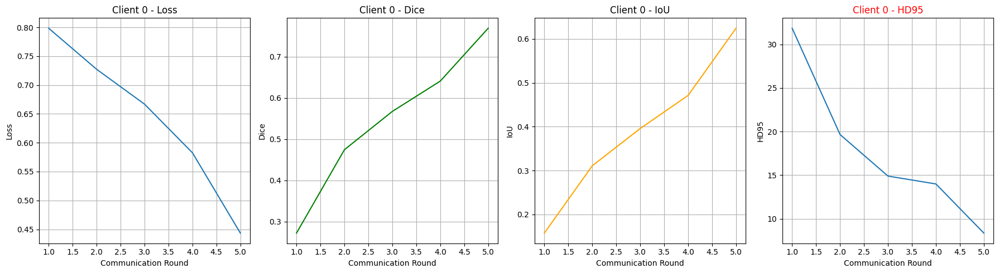

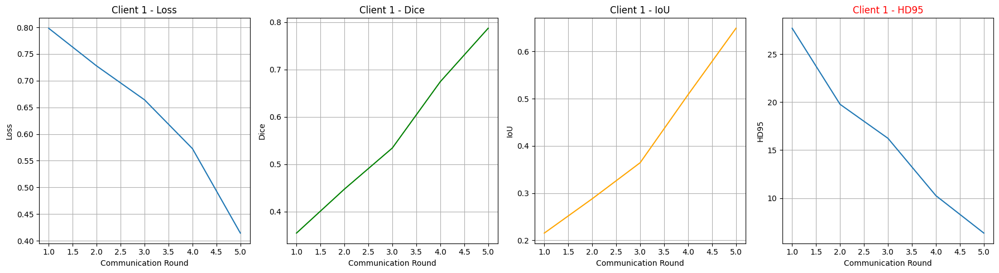

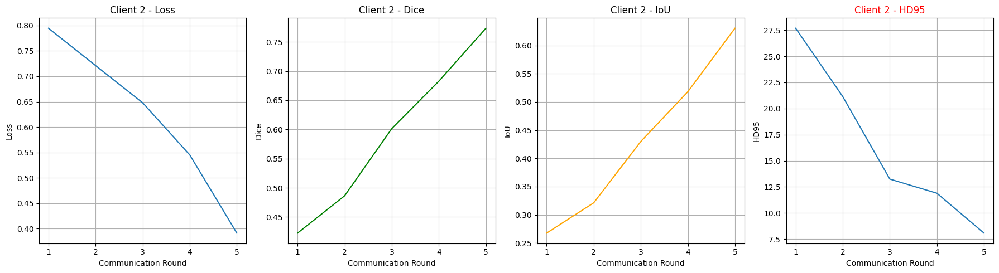

In [ ]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

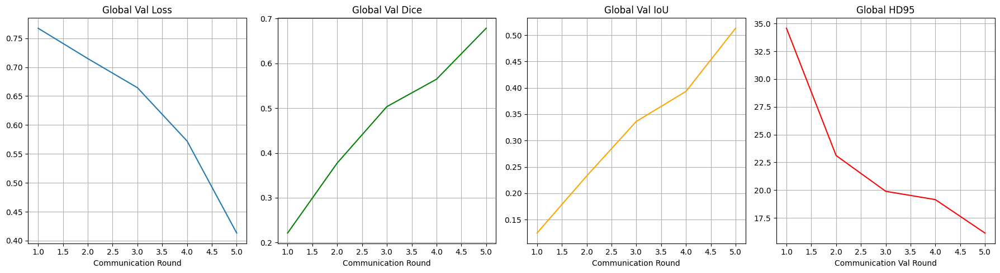

In [ ]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [ ]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_11592\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing:  52%|█████▏    | 26/50 [00:01<00:01, 13.58it/s, Dice=0.5924, IoU=0.4209, HD95=14.6242]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s, Dice=0.6485, IoU=0.4799, HD95=12.1948]


Test Set Metrics:
Dice: 0.6485
IoU: 0.4799
HD95: 12.1948


**Visualize**

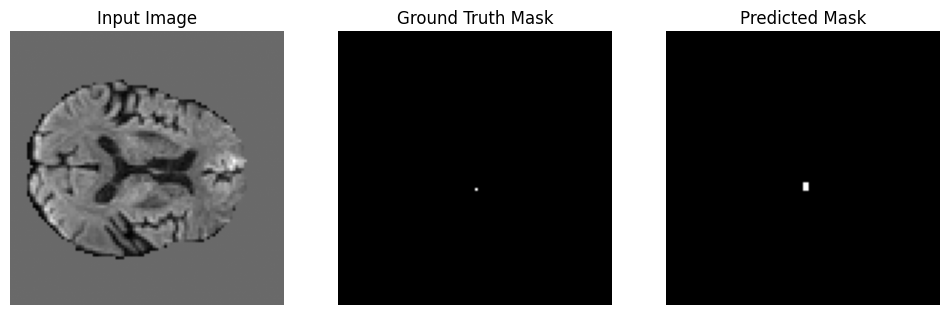

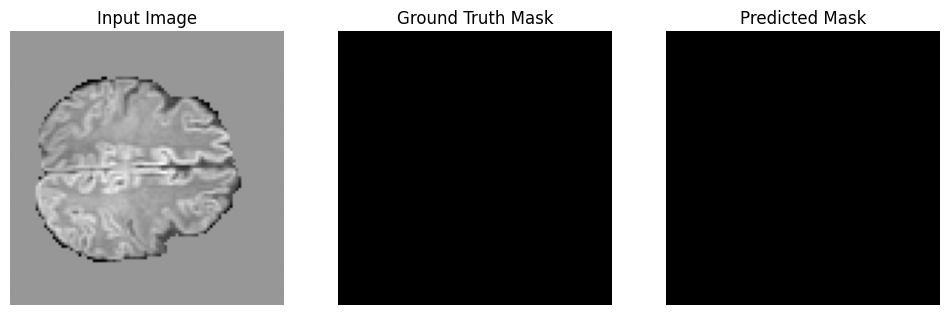

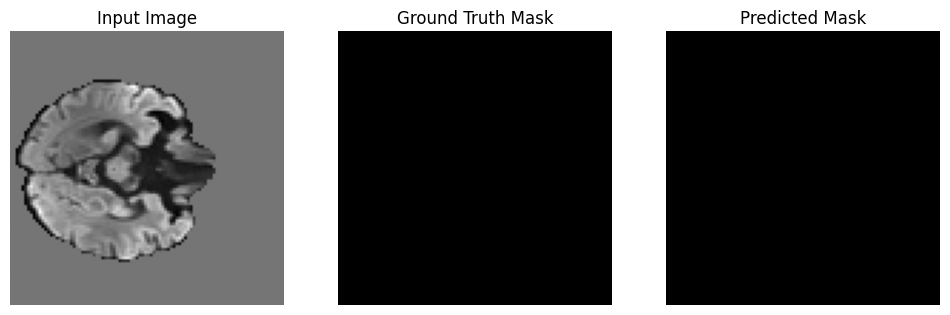

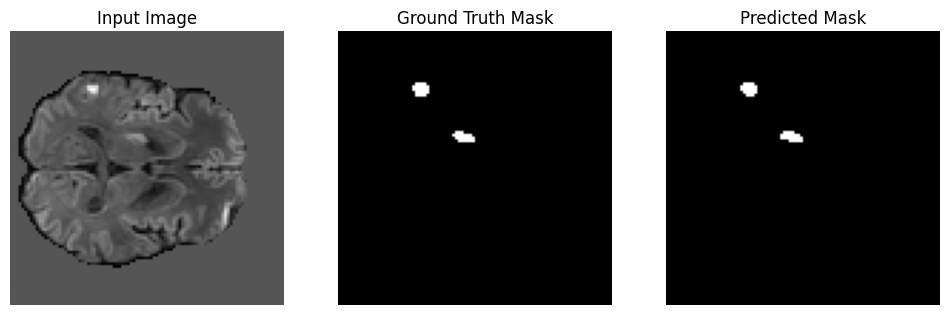

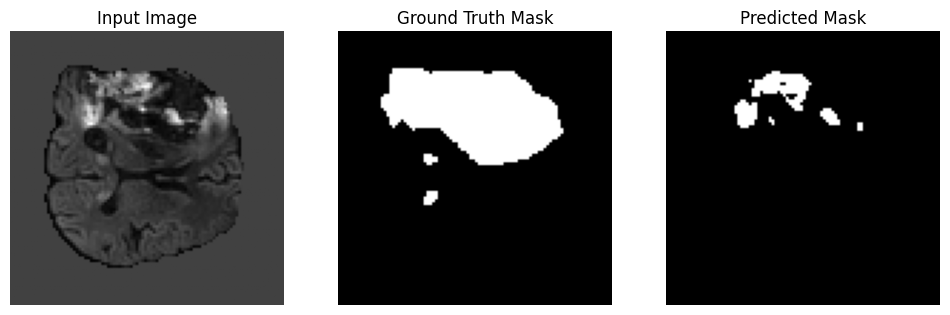

...

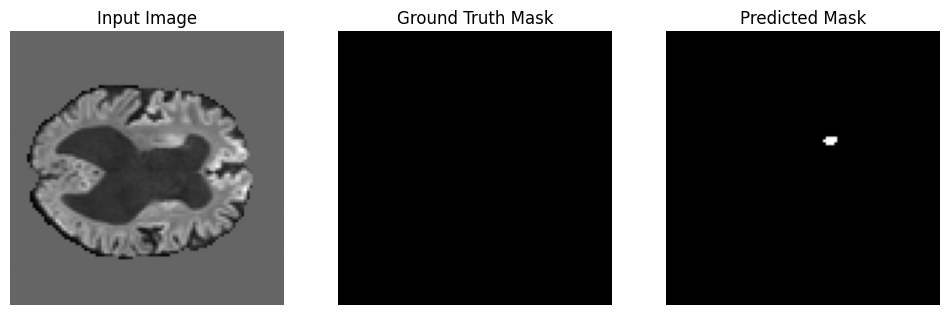

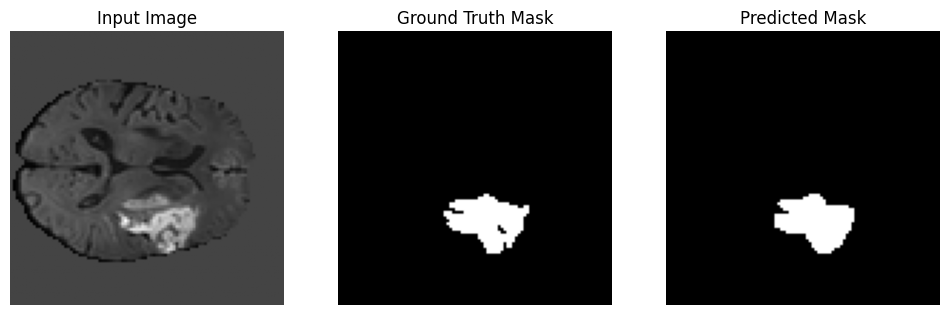

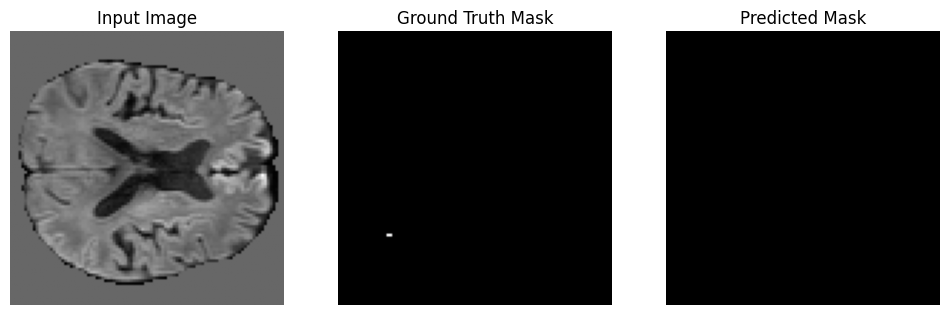

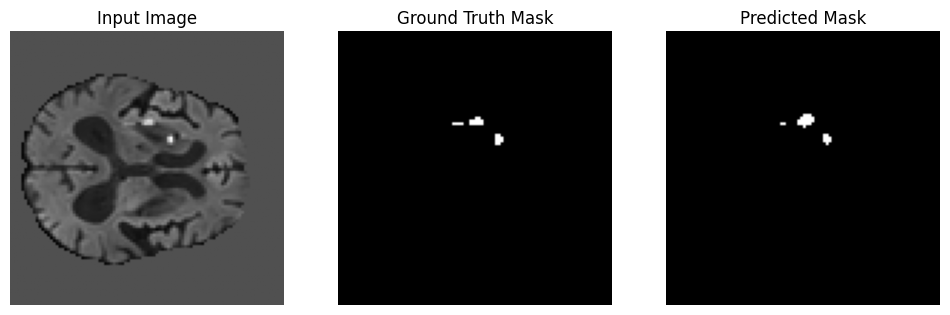

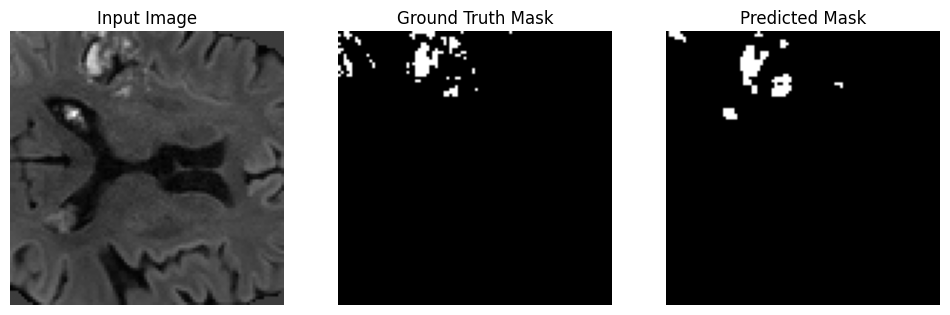

In [ ]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()